<a href="https://colab.research.google.com/github/minkezhang568/TransBTS/blob/main/site/en/tutorials/generative/pix2pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2019 The TensorFlow Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# pix2pix: Image-to-image translation with a conditional GAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/pix2pix"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/pix2pix.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This tutorial demonstrates how to build and train a conditional generative adversarial network (cGAN) called pix2pix that learns a mapping from input images to output images, as described in [Image-to-image translation with conditional adversarial networks](https://arxiv.org/abs/1611.07004) by Isola et al. (2017). pix2pix is not application specific—it can be applied to a wide range of tasks, including synthesizing photos from label maps, generating colorized photos from black and white images, turning Google Maps photos into aerial images, and even transforming sketches into photos.

In this example, your network will generate images of building facades using the [CMP Facade Database](http://cmp.felk.cvut.cz/~tylecr1/facade/) provided by the [Center for Machine Perception](http://cmp.felk.cvut.cz/) at the [Czech Technical University in Prague](https://www.cvut.cz/). To keep it short, you will use a [preprocessed copy](https://efrosgans.eecs.berkeley.edu/pix2pix/datasets/) of this dataset created by the pix2pix authors.

In the pix2pix cGAN, you condition on input images and generate corresponding output images. cGANs were first proposed in [Conditional Generative Adversarial Nets](https://arxiv.org/abs/1411.1784) (Mirza and Osindero, 2014)

The architecture of your network will contain:

- A generator with a [U-Net](https://arxiv.org/abs/1505.04597)-based architecture.
- A discriminator represented by a convolutional PatchGAN classifier (proposed in the [pix2pix paper](https://arxiv.org/abs/1611.07004)).

Note that each epoch can take around 15 seconds on a single V100 GPU.

Below are some examples of the output generated by the pix2pix cGAN after training for 200 epochs on the facades dataset (80k steps).

![sample output_1](https://www.tensorflow.org/images/gan/pix2pix_1.png)
![sample output_2](https://www.tensorflow.org/images/gan/pix2pix_2.png)

In [140]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display
from tensorflow.keras import layers



In [141]:
import SimpleITK as sitk

In [2]:
!pip install SimpleITK


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 9.8 MB/s eta 0:00:00


## Import TensorFlow and other libraries

## Load the dataset

Download the CMP Facade Database data (30MB). Additional datasets are available in the same format [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/). In Colab you can select other datasets from the drop-down menu. Note that some of the other datasets are significantly larger (`edges2handbags` is 8GB in size).

In [41]:
dataset_name = "facades" #@param ["cityscapes", "edges2handbags", "edges2shoes", "facades", "maps", "night2day"]


In [4]:
from google.colab import files

# Upload the image from your local machine
uploaded = files.upload()


Saving Datasets (2).tar to Datasets (2).tar


In [142]:
import tarfile

# Path to the uploaded tar.gz file
tar_path = 'Datasets (2).tar'

# Extract the contents of the tar.gz file
with tarfile.open(tar_path, 'r') as tar_ref:
    tar_ref.extractall('Datasets (2)')

# Verify the contents of the extracted folder
import os
print(os.listdir('Datasets (2)'))



['Datasets']


In [143]:
# Define dataset path
PATH = pathlib.Path("/content/Datasets (2)/Datasets/")

In [144]:
list(PATH.parent.iterdir())

[PosixPath('/content/Datasets (2)/Datasets')]

In [195]:

sample_image = tf.io.read_file(str(PATH / 'Train/62.png'))
sample_image = tf.io.decode_png(sample_image)
sample_image = tf.image.grayscale_to_rgb(sample_image)
print(sample_image.shape)

(333, 542, 3)


In [14]:
image_path = 'Datasets/Datasets/Train/62.png'
sample_image = tf.io.read_file(image_path)
sample_image = tf.io.decode_png(sample_image)
sample_image = tf.image.grayscale_to_rgb(sample_image)
print(sample_image.shape)

NotFoundError: {{function_node __wrapped__ReadFile_device_/job:localhost/replica:0/task:0/device:CPU:0}} Datasets/Datasets/Train/62.png; No such file or directory [Op:ReadFile]

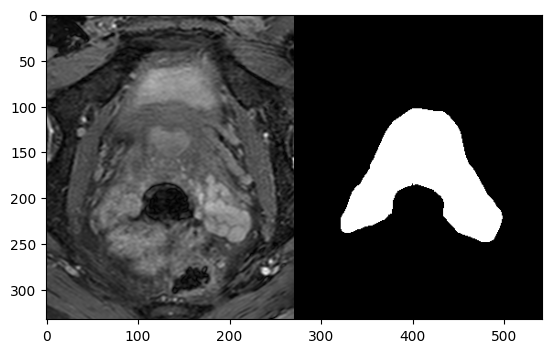

In [196]:
plt.figure()
plt.imshow(sample_image)

In [197]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_png(image)
  #Convert to RGB format
  image = tf.image.grayscale_to_rgb(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

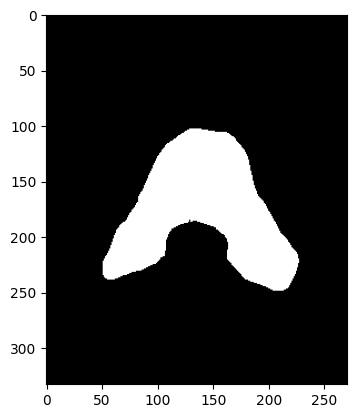

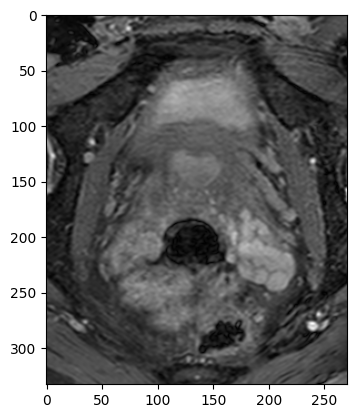

In [198]:
inp, re = load(str(PATH / 'Train/62.png'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [10]:

image_path = 'DevelopmentData/DevelopmentData/p108/mr_bffe.mhd' # Replace '1.jpg' with any image filename you want to process

# Read the image using SimpleITK
image = sitk.ReadImage(image_path)

# Convert the SimpleITK image to a NumPy array
image_array = sitk.GetArrayFromImage(image)

# Convert the NumPy array to a TensorFlow tensor
image_tensor = tf.convert_to_tensor(image_array[30,:,:], dtype=tf.float32)

# Print the shape of the image tensor
print(f"Image tensor shape: {image_tensor.shape}")


Image tensor shape: (333, 271)


Each original image is of size `256 x 512` containing two `256 x 256` images:

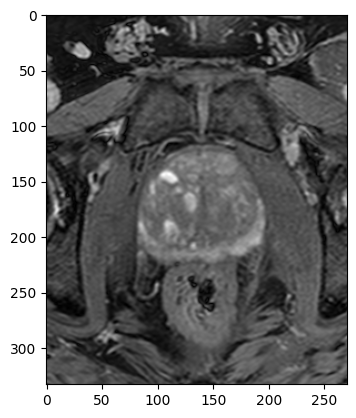

In [11]:
plt.imshow(image_array[30,:,:],cmap='gray')
plt.show()


You need to separate real building facade images from the architecture label images—all of which will be of size `256 x 256`.

Define a function that loads image files and outputs two image tensors:

In [193]:
def load(image_file):

  image_path = os.path.join(image_file, "mr_bffe.mhd")
  mask_path = os.path.join(image_file, "prostaat.mhd")

  # Read the image using SimpleITK
  image = sitk.ReadImage(image_path)
  mask = sitk.ReadImage(mask_path)

  # Convert the SimpleITK image to a NumPy array
  image_array = sitk.GetArrayFromImage(image)
  mask_array = sitk.GetArrayFromImage(mask)

  #
  input_image = np.expand_dims(mask_array[30,:,:], axis=-1)  # Add channel dim
  real_image = np.expand_dims(image_array[30,:,:], axis=-1)  # Add channel dim

  # Convert the NumPy array to a TensorFlow tensor
  real_image = tf.convert_to_tensor(real_image, dtype=tf.float32)
  input_image = tf.convert_to_tensor(input_image, dtype=tf.float32)



  return input_image, real_image

Plot a sample of the input (architecture label image) and real (building facade photo) images:

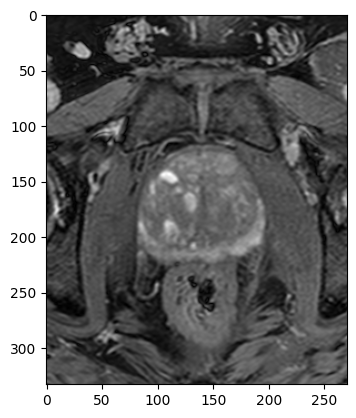

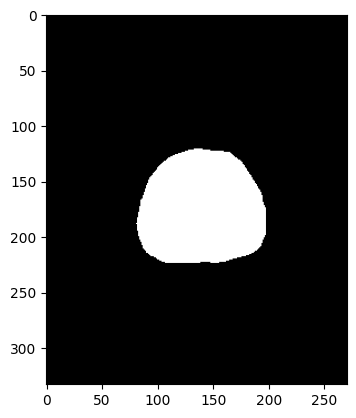

In [34]:
# Set the path to the image in the 'train' folder
image_path = 'DevelopmentData/DevelopmentData/p108' # Replace '1.jpg' with any image filename you want to process

# Read the image file
inp, re = load(image_path)

# Casting to int for matplotlib to display the images
plt.imshow(re,cmap='gray')
plt.show()
plt.imshow(inp,cmap='gray')
plt.show()


As described in the [pix2pix paper](https://arxiv.org/abs/1611.07004), you need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

1. Resize each `256 x 256` image to a larger height and width—`286 x 286`.
2. Randomly crop it back to `256 x 256`.
3. Randomly flip the image horizontally i.e., left to right (random mirroring).
4. Normalize the images to the `[-1, 1]` range.

In [199]:
# The facade training set consist of 400 images
BUFFER_SIZE = 1032   # 86*12
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [200]:
import numpy as np

In [201]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [202]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 1])

  return cropped_image[0], cropped_image[1]

In [203]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [204]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286 *286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256*256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

You can inspect some of the preprocessed output:

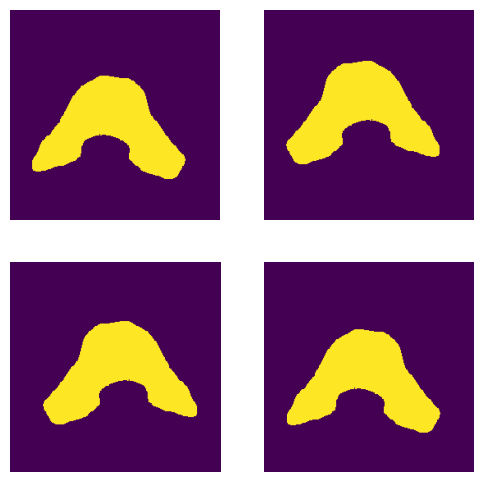

In [205]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

Having checked that the loading and preprocessing works, let's define a couple of helper functions that load and preprocess the training and test sets:

In [206]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)
  #Convert to RGB format
  input_image = tf.image.grayscale_to_rgb(input_image)
  real_image = tf.image.grayscale_to_rgb(real_image)

  # Resizing to 286 *286
  input_image, real_image = resize(input_image, real_image, 256, 256)

  print (input_image.shape)
  return input_image, real_image

In [207]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

## Build an input pipeline with `tf.data`

In [ ]:
image_path =

In [208]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'Train/*.png'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

(256, 256, 3)


In [209]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'Test/*.png'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build the generator

The generator of your pix2pix cGAN is a _modified_ [U-Net](https://arxiv.org/abs/1505.04597). A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the [Image segmentation](../images/segmentation.ipynb) tutorial and on the [U-Net project website](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/).)

- Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU
- Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU
- There are skip connections between the encoder and decoder (as in the U-Net).

Define the downsampler (encoder):

In [210]:
OUTPUT_CHANNELS = 3

In [255]:
# Function to add random noise
class NoiseInjection(tf.keras.layers.Layer):
    def __init__(self, strength=0.8):     #0.1
        super(NoiseInjection, self).__init__()
        self.strength = tf.Variable(initial_value=strength, trainable=True)

    def call(self, x, training=True):
        if training:
            noise = tf.random.normal(shape=tf.shape(x), mean=0.0, stddev=self.strength)
            return x + noise
        return x

In [262]:
# Function to create downsampling layers with noise
def downsample(filters, size, apply_batchnorm=True, apply_noise=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    if apply_noise:
        result.add(NoiseInjection(strength=0.9))  # Adding noise layer #0.05

    return result

In [211]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)


  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [212]:
# Step 1: Resize the image to (256, 256)
inp = tf.image.resize(inp, (256, 256))  # Resize to (256, 256)



In [213]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


Define the upsampler (decoder):

In [265]:
# Function to create upsampling layers with noise
def upsample(filters, size, apply_dropout=False, apply_noise=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                               padding='same',
                                               kernel_initializer=initializer,
                                               use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    if apply_noise:
        result.add(NoiseInjection(strength=0.9))  # Adding noise layer

    return result

In [214]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [215]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


Define the generator with the downsampler and the upsampler:

In [216]:
import tensorflow as tf

def Generator(OUTPUT_CHANNELS, num_outputs=5):
    # Noise input (latent noise vector)
    noise_input = tf.keras.layers.Input(shape=[100])  # Latent noise vector

    # Image input
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    # Add random noise as an additional input, combined with the image input
    noise_layer = tf.keras.layers.Dense(256, activation='relu')(noise_input)  # Mapping noise to a suitable shape
    noise_layer = tf.keras.layers.Reshape([1, 1, 256])(noise_layer)  # Reshaping to match the spatial dimensions

    # Upsample noise tensor to match feature map dimensions (128, 128)
    noise_upsampled = tf.keras.layers.UpSampling2D(size=(128, 128))(noise_layer)  # Upsample to 128x128

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')  # (batch_size, 256, 256, 3)

    # Loop to generate multiple outputs per image
    def generate_multiple_outputs(inputs, noise_input):
        outputs = []
        for _ in range(num_outputs):
            x = inputs

            # Downsampling through the model
            skips = []
            for down in down_stack:
                x = down(x)
                skips.append(x)

            skips = reversed(skips[:-1])

            # Upsampling and establishing the skip connections
            for up, skip in zip(up_stack, skips):
                x = up(x)
                x = tf.keras.layers.Concatenate()([x, skip])

            # Add the upsampled noise into the final layer
            x = tf.keras.layers.Concatenate()([x, noise_upsampled])  # Inject noise into the feature map

            x = last(x)
            outputs.append(x)
        return outputs

    # Call the function to generate multiple outputs
    output_images = generate_multiple_outputs(inputs, noise_input)

    return tf.keras.Model(inputs=[inputs, noise_input], outputs=output_images)







In [263]:
# Generator function with noise injection (multiple output)
def Generator(noise_dim=100):
    # Main Input (Image)
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Noise Input (Allows Multiple Outputs)
    noise_input = tf.keras.layers.Input(shape=[noise_dim])  # Latent noise vector
    noise_expanded = tf.keras.layers.Dense(256 * 256 * 1, activation="relu")(noise_input)  # Expand noise
    noise_expanded = tf.keras.layers.Reshape((256, 256, 1))(noise_expanded)  # Reshape to match image

    # Concatenate Noise with Image
    x = tf.keras.layers.Concatenate()([inputs, noise_expanded])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')  # (batch_size, 256, 256, 3)

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=[inputs, noise_input], outputs=x)

In [267]:
# Generator function with noise injection
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Adding noise to the input image
    noise_input = NoiseInjection(strength=0.1)(inputs)

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
        downsample(128, 4),  # (batch_size, 64, 64, 128)
        downsample(256, 4),  # (batch_size, 32, 32, 256)
        downsample(512, 4),  # (batch_size, 16, 16, 512)
        downsample(512, 4),  # (batch_size, 8, 8, 512)
        downsample(512, 4),  # (batch_size, 4, 4, 512)
        downsample(512, 4),  # (batch_size, 2, 2, 512)
        downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
        upsample(512, 4),  # (batch_size, 16, 16, 1024)
        upsample(256, 4),  # (batch_size, 32, 32, 512)
        upsample(128, 4),  # (batch_size, 64, 64, 256)
        upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')  # (batch_size, 256, 256, 3)

    x = noise_input  # Start with the input image + noise

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [109]:
def Generator():
    inputs = layers.Input(shape=[256, 256, 3])
    noise = layers.Input(shape=[256, 256, 1])
    x = layers.Concatenate()([inputs, noise])

    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same',
                                  kernel_initializer=initializer, activation='tanh') # 3: the value of output channels

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)
    return tf.keras.Model(inputs=[inputs, noise], outputs=x)

In [84]:
def Generator():
    inputs = layers.Input(shape=[256, 256, 3])  # Input shape (batch_size, 256, 256, 3)
    noise = layers.Input(shape=[256, 256, 1])  # Noise input for randomness

    x = layers.Concatenate()([inputs, noise])

    # Define the downsampling and upsampling stacks (as before)
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same',
                                  kernel_initializer=initializer, activation='tanh')  # Output shape: (batch_size, 256, 256, 3)

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    # Now we will modify the output to handle multiple outputs:
    return tf.keras.Model(inputs=[inputs, noise], outputs=x)



In [74]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

Visualize the generator model architecture:

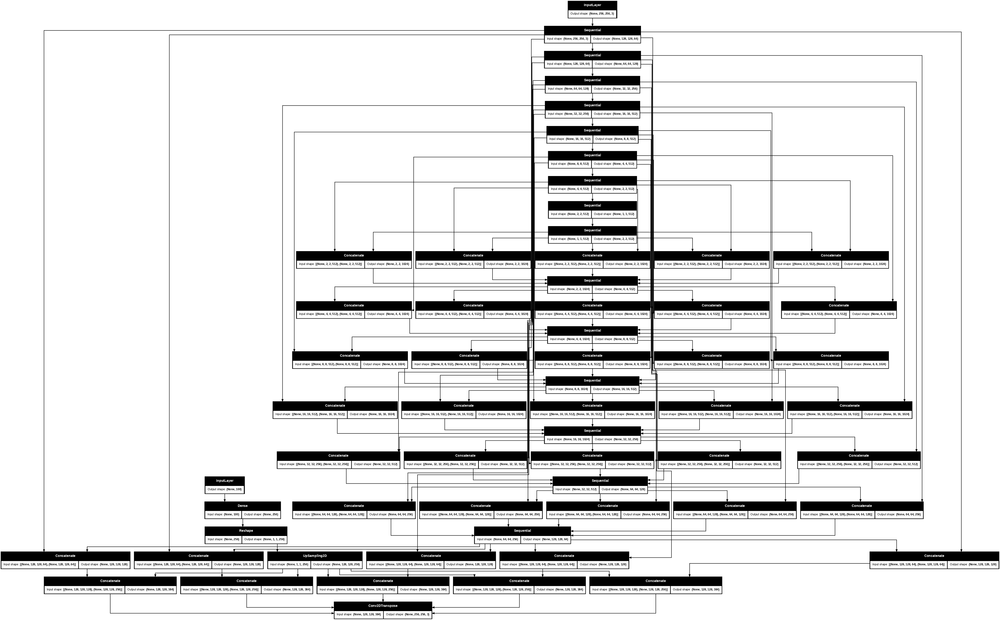

In [217]:
generator = Generator(3, 5)
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

Test the generator:

In [181]:
# Create the generator model
generator = Generator(OUTPUT_CHANNELS=3, num_outputs=5)  # For example, generate 5 images


# Prepare a sample input image (for testing)


# Generate noise input (latent vector)
noise_input = tf.random.normal([1, 100])  # Latent noise vector for a batch of size 1

# Generate multiple outputs for the input image
gen_output = generator([inp, noise_input], training=False)
print(gen_output.shape)

# Display all generated images
fig, axes = plt.subplots(1, num_outputs)

# Visualize the first generated image
for i in range (num_outputs):
 plt.imshow(gen_output[i][0, ...])  # Show the first generated image from the first output tensor
 plt.show()



AttributeError: 'list' object has no attribute 'shape'

(1, 256, 256, 3)


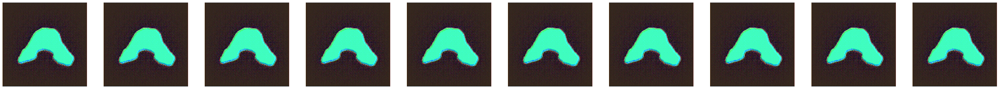

In [223]:
num_outputs = 10  # Generate 5 outputs per input

# Create the generator model
generator = Generator(OUTPUT_CHANNELS=3, num_outputs=10)  # For example, generate 5 images
# Generate noise input (latent vector)
noise_input = tf.random.normal([1, 100])  # Latent noise vector for a batch of size 1

# Generate multiple outputs for each input in the batch
gen_outputs = generator([inp[tf.newaxis, ...], noise_input], training=False)
# Example: Check the shape of the first tensor in the list
print(gen_outputs[0].shape)


# Display all generated images
fig, axes = plt.subplots(1, num_outputs, figsize=(num_outputs * 5, 5))

# Loop over each generated output
for j in range(num_outputs):
    # Access the first image from each batch output (gen_outputs[j] is a tensor)
    # gen_outputs[j] might have the shape (batch_size, height, width, channels)
    # To show the first image in the batch, we index gen_outputs[j][0, ...]

    axes[j].imshow(gen_outputs[j][0, ...])  # Show the first image from each output tensor
    axes[j].axis('off')  # Turn off the axis

plt.show()




In [33]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

ValueError: Layer "functional_17" expects 2 input(s), but it received 1 input tensors. Inputs received: [<tf.Tensor: shape=(1, 256, 256, 3), dtype=float32, numpy=
array([[[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]]], dtype=float32)>]

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [272]:
LAMBDA = 100

In [273]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [274]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  # Compute L1 loss across N generated images
  l1_loss = tf.reduce_mean(tf.abs(target- gen_output))  # Broadcasting target

  # Optional: Noise regularization term (to avoid excessive dependence on noise)
  # noise_reg_loss = tf.reduce_mean(tf.abs(noise)) * 0.01

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The training procedure for the generator is as follows:

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


## Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image _patch_ is real or not real, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004).

- Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.
- The shape of the output after the last layer is `(batch_size, 30, 30, 1)`.
- Each `30 x 30` image patch of the output classifies a `70 x 70` portion of the input image.
- The discriminator receives 2 inputs:
    - The input image and the target image, which it should classify as real.
    - The input image and the generated image (the output of the generator), which it should classify as fake.
    - Use `tf.concat([inp, tar], axis=-1)` to concatenate these 2 inputs together.

Let's define the discriminator:

In [192]:
# Modified the discriminator


def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    # Inputs
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')  # Real input image
    tar = tf.keras.layers.Input(shape=[None, 256, 256, 3], name='target_images')  # N generated images

    # Discriminator model applied to single image
    def single_image_discriminator(img):
        x = tf.keras.layers.concatenate([inp, img])  # (batch_size, 256, 256, channels*2)

        down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
        down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
        down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

        zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
        conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                      kernel_initializer=initializer,
                                      use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

        batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
        leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

        zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

        last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                      kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)
        return last

    # Apply the discriminator model to each synthesized image in `tar`
    processed_discriminator = tf.keras.layers.Lambda(
        lambda x: tf.map_fn(lambda img: single_image_discriminator(img), x, dtype=tf.float32),
        output_shape=(None, None, 30, 30, 1)  # Specify the output shape explicitly
    )(tar)  # Output shape: (batch_size, N, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=processed_discriminator)





In [275]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

Visualize the discriminator model architecture:

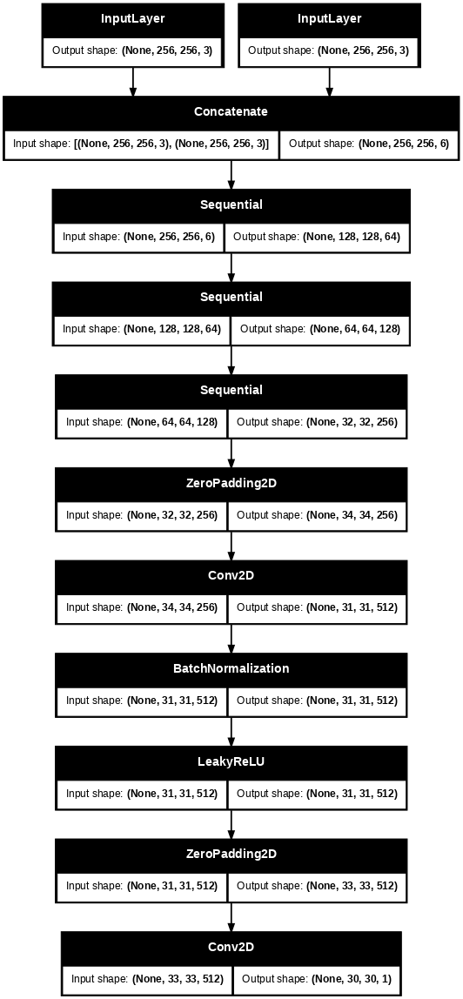

In [276]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

Test the discriminator:

In [199]:
# Generate N synthesized images
gen_output = generator([repeated_input, noise_vectors], training=False)  # (1, N, 256, 256, 3)

# Discriminator processes multiple images
disc_out = discriminator([repeated_input, gen_output], training=False)  # (1, N, 30, 30, 1)

# Plot the output for each generated image
# Assuming you want to plot all the discriminator's outputs for N synthesized images

# Visualize all discriminator outputs
n_images = disc_out.shape[1]  # N synthesized images
fig, axes = plt.subplots(1, n_images, figsize=(n_images * 3, 3))  # Create subplots

for i in range(n_images):
    ax = axes[i]
    ax.imshow(disc_out[0, i, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
    ax.set_title(f"Image {i+1}")
    ax.axis('off')  # Turn off axes

plt.colorbar(axes[0].images[0], ax=axes, orientation='horizontal', fraction=0.02)
plt.show()


ValueError: In a nested call() argument, you cannot mix tensors and non-tensors. Received invalid mixed argument: inputs=[array([[[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       ...,


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]],


       [[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        ...,

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]]], dtype=float32), <tf.Tensor: shape=(10, 256, 256, 3), dtype=float32, numpy=
array([[[[ 1.07788183e-04,  5.05233940e-04,  3.67894769e-04],
         [ 1.38384593e-03, -1.79480106e-04, -2.56528938e-03],
         [ 5.83804154e-04,  6.80835452e-04, -5.22682851e-04],
         ...,
         [-9.42503160e-04,  3.06010386e-03,  2.36731092e-03],
         [-2.89993361e-03,  2.57558259e-03,  1.33349793e-04],
         [-4.34104528e-04, -3.45588691e-04,  1.36048696e-03]],

        [[ 4.20462369e-04, -1.68056285e-03,  2.03538500e-03],
         [ 5.27554704e-03,  4.25652275e-03, -5.63406199e-03],
         [-6.41236128e-03, -6.15879148e-03,  4.57201665e-03],
         ...,
         [ 4.61541349e-03,  8.25424772e-03, -2.75776978e-03],
         [-1.18259471e-02, -3.64663429e-03, -9.43752192e-03],
         [ 1.60007132e-03,  3.99995269e-03, -2.09448859e-03]],

        [[-3.31405463e-04,  2.73414538e-03,  2.28991616e-04],
         [-6.58166071e-04, -9.68808308e-05, -4.86013060e-03],
         [ 9.72244772e-04,  8.66382103e-03,  1.31961913e-03],
         ...,
         [-1.82926073e-03, -1.60607672e-03,  1.04987277e-02],
         [-6.15977682e-03,  8.52409285e-03, -1.81370904e-03],
         [-2.52730935e-03,  2.84577208e-03, -7.59779825e-04]],

        ...,

        [[-9.89171909e-04,  6.75869000e-04,  4.25050640e-03],
         [-1.21247460e-04,  6.44187722e-03,  3.49841127e-03],
         [-1.09839980e-02,  8.10266752e-03,  1.41793434e-02],
         ...,
         [ 1.13057047e-02,  6.84460858e-03, -1.03924675e-02],
         [ 1.54890018e-02, -7.40340119e-03,  4.36103001e-04],
         [-5.90347860e-04,  1.16845733e-03, -2.32148659e-03]],

        [[-7.02821370e-03,  2.30196421e-03,  2.18596030e-03],
         [ 4.00961330e-03, -2.65505584e-03, -1.69156007e-02],
         [-1.06381867e-02,  1.29195852e-02, -2.32364889e-03],
         ...,
         [ 3.02471919e-04, -5.39668556e-03,  6.88280491e-03],
         [ 1.58905727e-03,  1.57283489e-02, -1.20259030e-02],
         [-9.60683729e-03,  1.08266645e-03, -1.00819999e-03]],

        [[-9.85659426e-04, -2.64193659e-04,  4.91427141e-04],
         [ 2.36171274e-03, -9.65927320e-04,  3.95386387e-03],
         [ 1.50297477e-03,  2.50288984e-03, -6.85227045e-04],
         ...,
         [-2.78215483e-03,  1.32094626e-03, -2.86205625e-03],
         [-1.08295877e-03,  1.03743479e-03, -2.53787090e-04],
         [ 1.60318523e-04,  2.41829694e-04, -1.87958372e-04]]],


       [[[ 1.84856326e-04,  1.98281152e-04,  2.68463657e-04],
         [ 1.40399591e-03,  5.30772377e-06, -2.47851573e-03],
         [ 1.85348763e-04,  3.92352231e-04, -3.54523567e-04],
         ...,
         [-9.15965589e-04,  2.83299992e-03,  2.67789117e-03],
         [-2.28357781e-03,  2.62499694e-03,  5.77694853e-04],
         [-5.99114923e-04,  1.09207722e-04,  1.77384540e-03]],

        [[ 2.09949620e-04, -1.29772397e-03,  3.04787396e-03],
         [ 5.19645959e-03,  4.58024116e-03, -6.17585005e-03],
         [-5.82731934e-03, -6.33688411e-03,  4.90587996e-03],
         ...,
         [ 4.25760169e-03,  7.80257350e-03, -2.36738962e-03],
         [-1.21857468e-02, -3.57769476e-03, -9.25576128e-03],
         [ 1.41418097e-03,  3.99332074e-03, -1.39690610e-03]],

        [[-2.63398921e-04,  1.99394883e-03, -5.03106974e-04],
         [-2.51134625e-04, -7.38008821e-04, -5.19353757e-03],
         [ 5.72321296e-04,  9.76078305e-03,  1.90562487e-03],
         ...,
         [-1.97889563e-03, -1.74855255e-03,  1.15337381e-02],
         [-6.44734083e-03,  8.07008240e-03, -1.51637720e-03],
         [-2.53811595e-03,  3.51277390e-03, -2.78583066e-05]],

        ...,

        [[-1.05930725e-03,  7.45377620e-04,  4.55427263e-03],
         [ 4.83097276e-04,  7.60986283e-03,  3.19588464e-03],
         [-1.07643418e-02,  9.08178836e-03,  1.39255030e-02],
         ...,
         [ 1.05709545e-02,  7.14598643e-03, -1.09832147e-02],
         [ 1.65413562e-02, -6.93084626e-03, -4.11828107e-04],
         [-8.63890396e-04,  9.96950548e-04, -2.51293392e-03]],

        [[-7.39102159e-03,  2.04334501e-03,  2.20991601e-03],
         [ 3.69031145e-03, -2.85552209e-03, -1.71920341e-02],
         [-1.07048787e-02,  1.36294151e-02, -2.00210931e-03],
         ...,
         [ 6.49785507e-04, -5.93856210e-03,  6.41629333e-03],
         [ 1.62712613e-03,  1.65624395e-02, -1.16173597e-02],
         [-9.47941002e-03,  7.94884807e-04, -4.97898145e-04]],

        [[-9.63406055e-04, -3.78602854e-04,  2.14011583e-04],
         [ 2.71875132e-03, -1.19672809e-03,  3.55694350e-03],
         [ 1.30776525e-03,  2.72215367e-03, -7.09613902e-04],
         ...,
         [-2.51148362e-03,  1.06561277e-03, -3.08819581e-03],
         [ 2.36448832e-04,  3.48127825e-04,  1.91844447e-04],
         [ 4.38654533e-04, -7.72972053e-05,  2.25722732e-04]]],


       [[[ 4.21871839e-04,  4.54244466e-04,  3.46565357e-04],
         [ 1.87999173e-03,  3.92879592e-04, -2.81554018e-03],
         [ 7.98329478e-04,  4.00366465e-04, -6.41891500e-04],
         ...,
         [-1.27035461e-03,  2.68546469e-03,  2.00368674e-03],
         [-2.29569897e-03,  2.55194097e-03,  1.42115692e-04],
         [-2.25818774e-04, -6.22544729e-04,  9.81651945e-04]],

        [[ 5.25286887e-05, -1.18972256e-03,  2.64834031e-03],
         [ 5.90903591e-03,  4.89611598e-03, -5.69482660e-03],
         [-6.40789326e-03, -6.06461661e-03,  4.47582174e-03],
         ...,
         [ 3.92066315e-03,  8.16619955e-03, -1.87252520e-03],
         [-1.23222256e-02, -2.95247789e-03, -8.43402278e-03],
         [ 1.42343936e-03,  4.16151155e-03, -2.24260543e-03]],

        [[-9.68193752e-04,  2.07699416e-03, -8.35795654e-05],
         [-1.37410709e-03, -7.13630870e-04, -5.32283448e-03],
         [ 3.69841000e-04,  9.79701430e-03,  1.65739679e-03],
         ...,
         [-1.65040675e-03, -1.14980841e-03,  1.10662309e-02],
         [-7.01680128e-03,  8.20672698e-03, -1.45165378e-03],
         [-2.61145202e-03,  2.31039454e-03, -1.22139254e-03]],

        ...,

        [[-1.38378213e-03,  8.24398594e-05,  4.24788380e-03],
         [-6.83252118e-04,  6.90288749e-03,  3.70533671e-03],
         [-1.07605476e-02,  8.08947161e-03,  1.45930955e-02],
         ...,
         [ 9.32875462e-03,  6.13933196e-03, -1.25556290e-02],
         [ 1.68815479e-02, -6.02147030e-03,  1.21050817e-03],
         [ 1.04488601e-04,  6.93809881e-04, -2.73758615e-03]],

        [[-7.14023830e-03,  2.64202384e-03,  2.27995845e-03],
         [ 4.46661655e-03, -2.21918058e-03, -1.65241398e-02],
         [-1.07927900e-02,  1.22807259e-02, -2.27817427e-03],
         ...,
         [ 1.49293058e-03, -6.52780477e-03,  5.42674074e-03],
         [ 1.09718507e-03,  1.65198501e-02, -1.15285739e-02],
         [-9.77291632e-03,  1.89140555e-03, -6.65774161e-04]],

        [[-1.05658546e-03, -1.52572597e-04,  3.97168478e-04],
         [ 2.03125319e-03, -1.17627205e-03,  4.13940568e-03],
         [ 1.14469847e-03,  2.04648077e-03, -9.27714224e-04],
         ...,
         [-2.48072250e-03,  9.37430363e-04, -3.17084324e-03],
         [-6.95397262e-04,  3.77706136e-04, -1.19305251e-03],
         [ 2.23922703e-04, -7.51999032e-04,  1.68531988e-04]]],


       ...,


       [[[ 1.86646081e-04,  2.34322273e-04,  3.63609346e-04],
         [ 1.54815486e-03,  4.27473889e-04, -2.22604023e-03],
         [ 5.52932674e-04,  7.68873608e-04, -5.27217169e-04],
         ...,
         [-1.13355624e-03,  2.79282336e-03,  2.32523819e-03],
         [-2.89197592e-03,  2.48005707e-03,  1.97941670e-04],
         [-3.95760610e-04, -5.93849516e-04,  1.21015357e-03]],

        [[ 3.51689785e-04, -1.61077373e-03,  3.07396171e-03],
         [ 5.47357369e-03,  4.57062479e-03, -5.72480634e-03],
         [-6.31226646e-03, -6.90944213e-03,  5.25618298e-03],
         ...,
         [ 4.00959281e-03,  8.13352875e-03, -2.29176809e-03],
         [-1.19534396e-02, -3.38971289e-03, -8.95909406e-03],
         [ 1.51277287e-03,  4.02414985e-03, -2.15300079e-03]],

        [[-2.48858065e-04,  2.05466826e-03, -3.00076092e-04],
         [-1.34079158e-03, -6.88407570e-04, -4.34899237e-03],
         [ 7.60972325e-04,  9.34402365e-03,  9.87702631e-04],
         ...,
         [-1.34915416e-03, -1.85225962e-03,  1.12975519e-02],
         [-6.62037591e-03,  8.31165258e-03, -1.41610566e-03],
         [-2.55949306e-03,  2.74722534e-03, -4.98790178e-04]],

        ...,

        [[-1.04519760e-03,  8.69623560e-04,  4.38483246e-03],
         [-6.43033884e-04,  7.05909217e-03,  2.94120284e-03],
         [-1.10593447e-02,  8.89375154e-03,  1.43227959e-02],
         ...,
         [ 1.11022489e-02,  6.56681042e-03, -1.17874276e-02],
         [ 1.68047734e-02, -7.28535466e-03,  2.97909835e-04],
         [-9.56752861e-04,  7.65134231e-04, -2.58121104e-03]],

        [[-7.40193296e-03,  1.93618785e-03,  2.17898400e-03],
         [ 4.59166011e-03, -3.17160739e-03, -1.74913611e-02],
         [-1.09591195e-02,  1.35851586e-02, -1.71949947e-03],
         ...,
         [ 4.73253807e-04, -6.44221622e-03,  5.76880667e-03],
         [ 1.02385739e-03,  1.62053294e-02, -1.26470402e-02],
         [-9.41693131e-03,  3.40110040e-04, -6.41196850e-04]],

        [[-8.71292898e-04, -3.62707069e-04,  3.39691323e-04],
         [ 2.69572157e-03, -9.95199196e-04,  3.62523738e-03],
         [ 1.32160494e-03,  2.68084742e-03, -7.42118456e-04],
         ...,
         [-2.16999976e-03,  7.59056071e-04, -3.21999029e-03],
         [ 2.30255362e-04,  7.12969922e-04, -1.37257273e-03],
         [-9.50152171e-05, -1.27065738e-04,  4.84055927e-04]]],


       [[[ 8.47693082e-05,  3.10174597e-04,  4.32454544e-04],
         [ 1.78492651e-03,  4.60771989e-04, -2.27946858e-03],
         [ 4.79534734e-04,  8.20488669e-04, -5.45370393e-04],
         ...,
         [-6.61859754e-04,  3.68407601e-03,  2.20435881e-03],
         [-2.12409929e-03,  2.04205723e-03,  6.61245256e-04],
         [-3.24819674e-04, -4.72705811e-04,  1.25216274e-03]],

        [[-7.21141696e-05, -1.53968483e-03,  2.89659109e-03],
         [ 5.34999650e-03,  4.32251627e-03, -5.48703736e-03],
         [-5.44729782e-03, -6.66234829e-03,  5.08035114e-03],
         ...,
         [ 4.99632349e-03,  8.27782042e-03, -1.91450852e-03],
         [-1.24697778e-02, -4.19903686e-03, -9.76948626e-03],
         [ 2.00538198e-03,  3.80747602e-03, -2.31685583e-03]],

        [[-2.96990911e-04,  2.45127967e-03, -1.46920793e-04],
         [-1.15568098e-03, -3.84170562e-05, -4.75064432e-03],
         [ 1.51978130e-03,  9.42562241e-03,  9.31506220e-04],
         ...,
         [-1.74210814e-03, -7.18042487e-04,  1.02193132e-02],
         [-6.18592324e-03,  9.39163379e-03, -1.00588799e-03],
         [-2.57350667e-03,  2.93680513e-03, -8.84694571e-04]],

        ...,

        [[-9.37699282e-04,  6.79551158e-05,  4.77930391e-03],
         [-8.13764462e-04,  7.01163476e-03,  3.07337730e-03],
         [-1.01730516e-02,  8.83802306e-03,  1.42027996e-02],
         ...,
         [ 1.03405882e-02,  6.64390810e-03, -1.13600586e-02],
         [ 1.62871759e-02, -7.51966285e-03,  2.93852063e-05],
         [-8.92273907e-04,  1.03691616e-03, -2.57932255e-03]],

        [[-6.90056430e-03,  2.10428215e-03,  1.50785793e-03],
         [ 5.07018343e-03, -3.08343954e-03, -1.66919231e-02],
         [-1.11734141e-02,  1.30966110e-02, -1.26348890e-03],
         ...,
         [ 9.92607558e-04, -6.44954061e-03,  6.64044963e-03],
         [ 1.49754121e-03,  1.70851201e-02, -1.21180760e-02],
         [-1.04353167e-02,  1.15557562e-03, -2.94295838e-04]],

        [[-5.04204188e-04, -2.76705454e-04,  8.23556766e-05],
         [ 2.65504420e-03, -1.17663853e-03,  3.55755654e-03],
         [ 1.08539918e-03,  2.05932232e-03, -1.02814462e-03],
         ...,
         [-1.93176512e-03,  6.74020208e-04, -3.22665763e-03],
         [-5.53157239e-04,  1.81034819e-04, -1.51713158e-03],
         [-8.59709398e-05, -1.77703201e-04,  1.00388634e-03]]],


       [[[ 7.65827426e-05,  2.77695508e-04,  2.91161297e-04],
         [ 1.43755367e-03,  3.79708974e-04, -1.96785480e-03],
         [ 4.06370964e-05,  5.67534124e-04, -4.60329611e-04],
         ...,
         [-1.15116232e-03,  2.96851736e-03,  1.92538439e-03],
         [-2.55151163e-03,  2.49286648e-03,  3.64303589e-04],
         [-3.23115237e-04, -3.02105851e-04,  8.29471217e-04]],

        [[ 4.05606697e-04, -1.38860021e-03,  3.30982683e-03],
         [ 4.68919799e-03,  4.69603715e-03, -5.12280827e-03],
         [-6.92545576e-03, -7.18081044e-03,  4.68199654e-03],
         ...,
         [ 3.90440715e-03,  8.37432034e-03, -2.11862219e-03],
         [-1.27716288e-02, -3.19160917e-03, -8.36343877e-03],
         [ 1.70646387e-03,  4.03462164e-03, -2.27752444e-03]],

        [[ 2.38397013e-04,  2.94183497e-03, -3.83567909e-04],
         [-7.48185848e-04, -2.08459212e-04, -4.45215823e-03],
         [ 5.66832547e-04,  1.01012196e-02,  2.15577381e-03],
         ...,
         [-1.29567471e-03, -1.18498947e-03,  1.09367212e-02],
         [-6.88426755e-03,  7.81244365e-03, -1.54880155e-03],
         [-2.70385342e-03,  2.38487241e-03, -1.36431365e-03]],

        ...,

        [[-1.43181090e-03,  6.90415327e-04,  4.86907922e-03],
         [-3.79475328e-04,  6.92457333e-03,  3.34030832e-03],
         [-1.08717866e-02,  8.86465237e-03,  1.48414709e-02],
         ...,
         [ 1.04460176e-02,  7.30588334e-03, -1.19468365e-02],
         [ 1.71150565e-02, -6.94046030e-03, -1.80803821e-04],
         [-7.87793251e-04,  9.66428546e-04, -2.46707350e-03]],

        [[-7.27694621e-03,  2.40765628e-03,  2.20655766e-03],
         [ 4.58156550e-03, -3.35102249e-03, -1.69746764e-02],
         [-1.08635239e-02,  1.36010181e-02, -2.09934916e-03],
         ...,
         [ 8.22011614e-04, -6.57765893e-03,  5.99036459e-03],
         [ 1.10501132e-03,  1.61809511e-02, -1.21832034e-02],
         [-9.65810195e-03,  8.18322820e-04, -5.94232057e-04]],

        [[-7.87493715e-04, -3.61574872e-04,  1.92712687e-04],
         [ 2.37399479e-03, -1.28542772e-03,  3.89213511e-03],
         [ 1.42295333e-03,  2.35639326e-03, -9.63759550e-04],
         ...,
         [-2.32009985e-03,  1.16628746e-03, -2.97698355e-03],
         [ 4.16373950e-05,  4.58620692e-04, -7.82379298e-04],
         [ 4.56995622e-05, -1.93463973e-04,  7.15769711e-04]]]],
      dtype=float32)>]

In [205]:
# Ensure repeated_input and noise_vectors are tensors
repeated_input = tf.convert_to_tensor(repeated_input, dtype=tf.float32)

# Ensure gen_outputs are TensorFlow tensors
gen_outputs = tf.convert_to_tensor(gen_outputs, dtype=tf.float32)

print("Shape of repeated_input:", repeated_input.shape)
print("Shape of gen_outputs:", gen_outputs.shape)

# Discriminator processes the synthesized images (outputs)
disc_out = discriminator([repeated_input, gen_outputs], training=False)  # Shape: (N, 30, 30, 1)

# Plot the discriminator's output for each generated image
fig, axes = plt.subplots(1, N, figsize=(N * 2, 2))
for i in range(N):
    axes[i].imshow(disc_out[i, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')  # Plot discriminator output for each image
    axes[i].axis('off')  # Hide axis

# Show color bar across all plots
plt.colorbar(axes[0].images[0], ax=axes, orientation='horizontal', fraction=0.02)
plt.show()

Shape of repeated_input: (10, 256, 256, 3)
Shape of gen_outputs: (10, 256, 256, 3)


ValueError: Input 1 of layer "functional_117" is incompatible with the layer: expected shape=(None, None, 256, 256, 3), found shape=(10, 256, 256, 3)

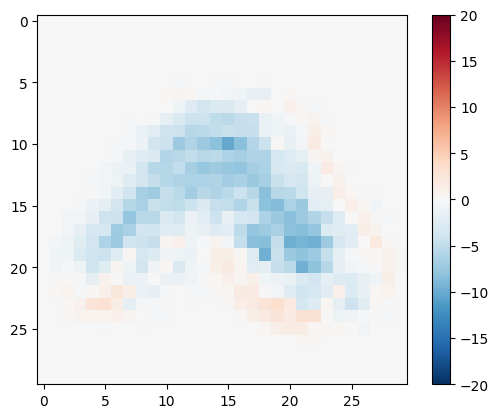

In [277]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

### Define the discriminator loss

- The `discriminator_loss` function takes 2 inputs: **real images** and **generated images**.
- `real_loss` is a sigmoid cross-entropy loss of the **real images** and an **array of ones(since these are the real images)**.
- `generated_loss` is a sigmoid cross-entropy loss of the **generated images** and an **array of zeros (since these are the fake images)**.
- The `total_loss` is the sum of `real_loss` and `generated_loss`.

In [278]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

The training procedure for the discriminator is shown below.

To learn more about the architecture and the hyperparameters you can refer to the [pix2pix paper](https://arxiv.org/abs/1611.07004).

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


## Define the optimizers and a checkpoint-saver


In [279]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [280]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [281]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Test the function:

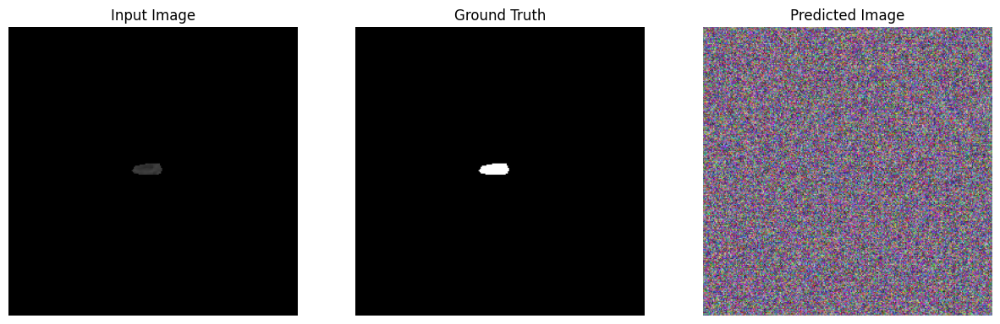

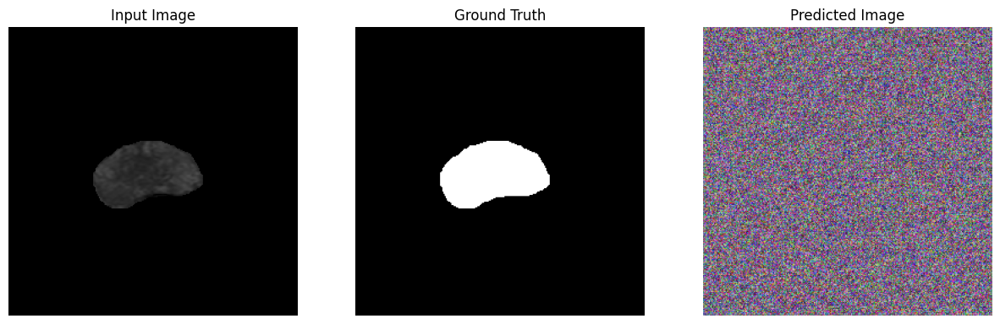

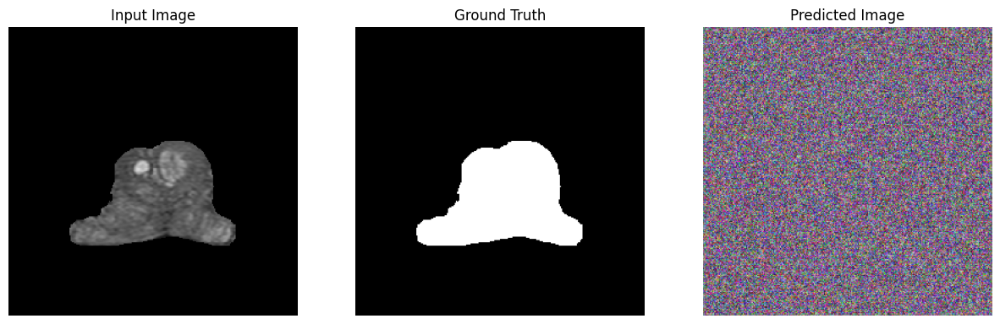

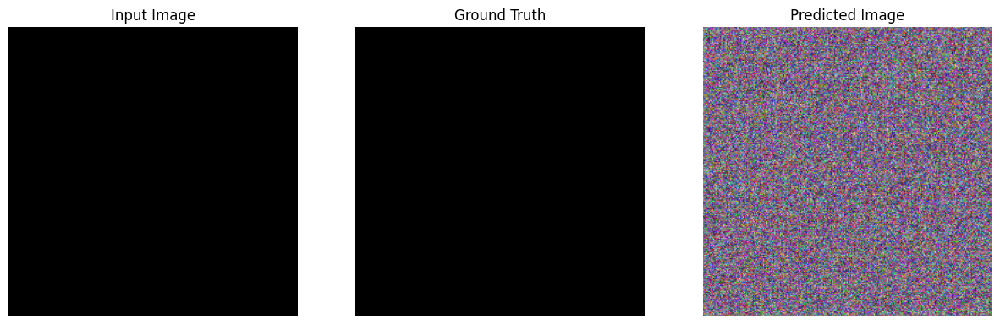

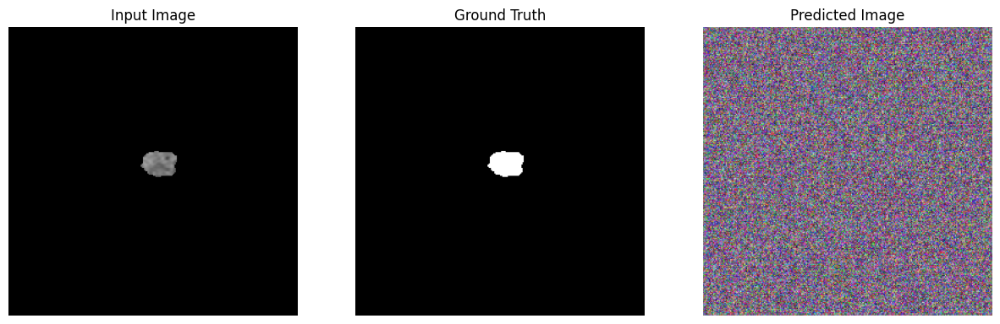

In [282]:
for example_input, example_target in test_dataset.take(5):
  generate_images(generator, example_input, example_target)

## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [283]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [284]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

- Iterates over the number of steps.
- Every 10 steps print a dot (`.`).
- Every 1k steps: clear the display and run `generate_images` to show the progress.
- Every 5k steps: save a checkpoint.

In [285]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

Launch the TensorBoard viewer (Sorry, this doesn't
display on tensorflow.org):

In [286]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2145), started 1:20:59 ago. (Use '!kill 2145' to kill it.)

<IPython.core.display.Javascript object>

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

Finally, run the training loop:

Time taken for 1000 steps: 123.45 sec



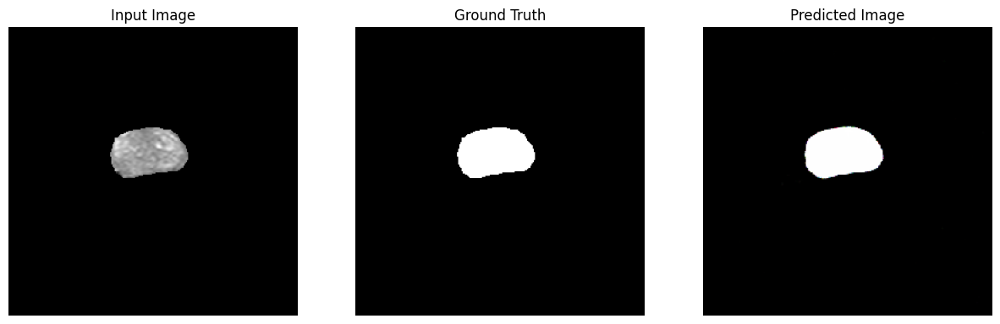

Step: 4k
....................................................................................................

In [288]:
fit(train_dataset, test_dataset, steps=5000)

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

## Restore the latest checkpoint and test the network

In [289]:
!ls {checkpoint_dir}

checkpoint  ckpt-1.data-00000-of-00001	ckpt-1.index


In [290]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Generate some images using the test set

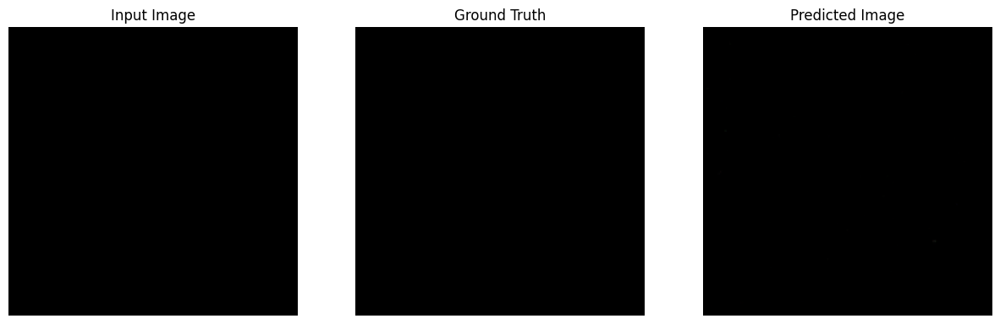

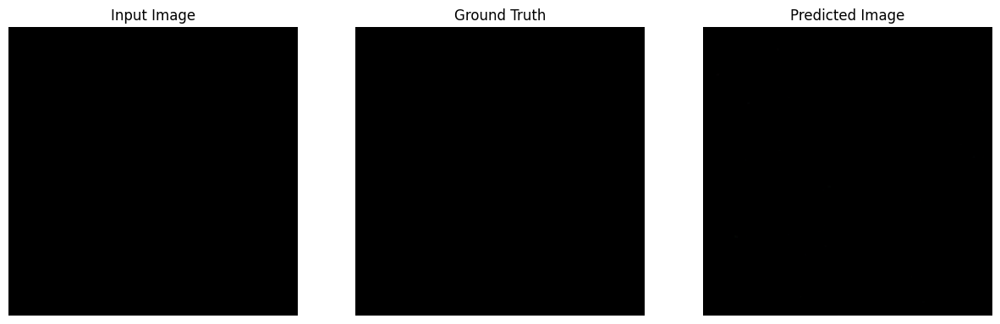

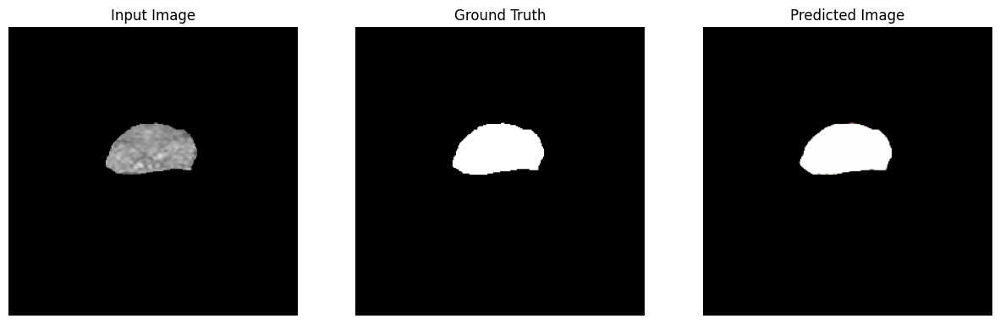

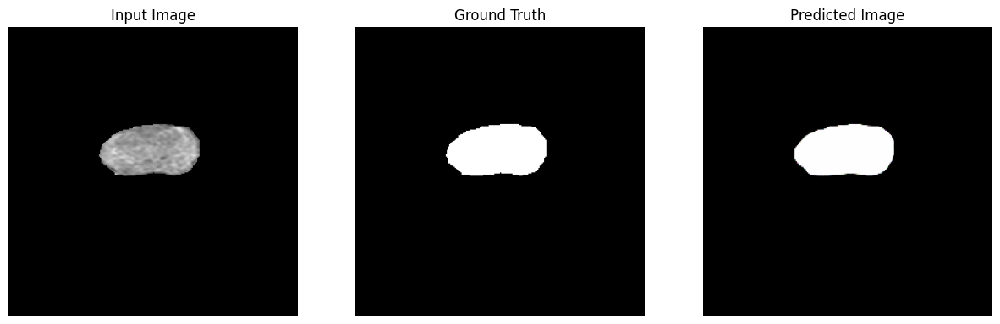

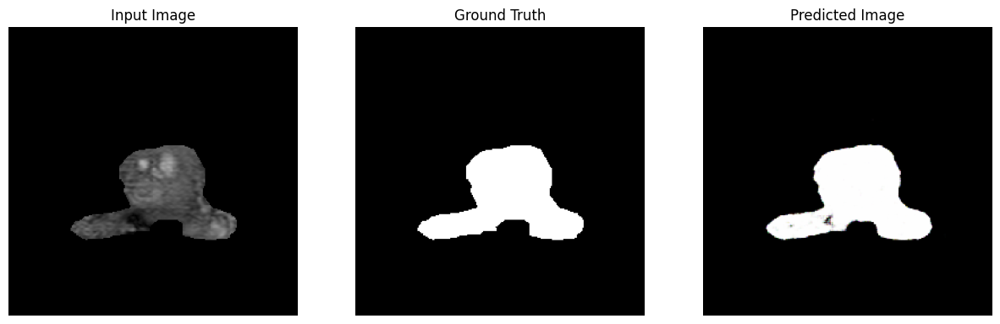

...

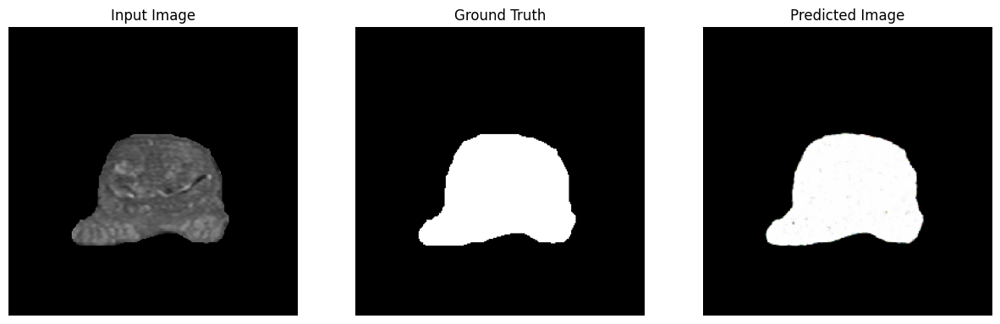

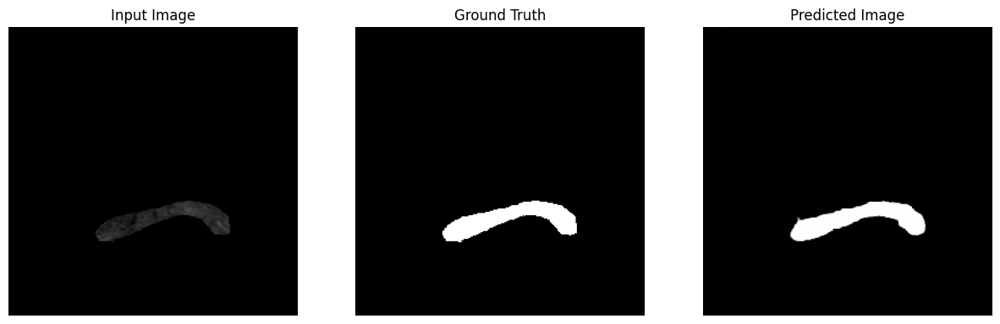

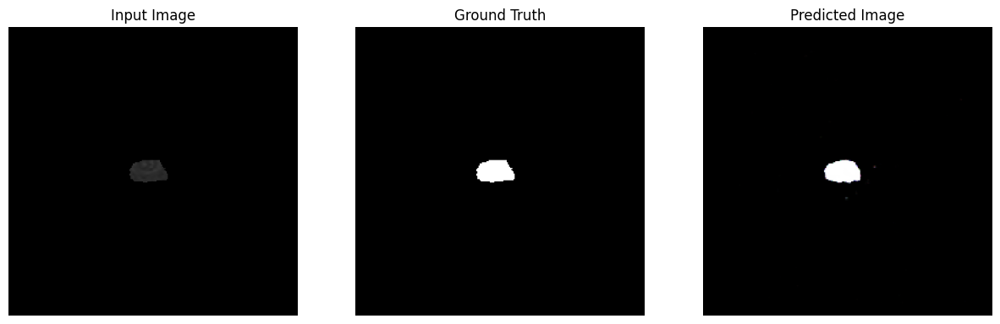

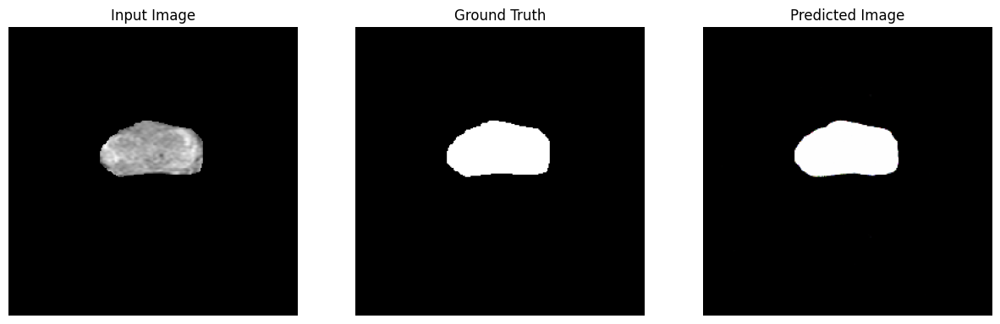

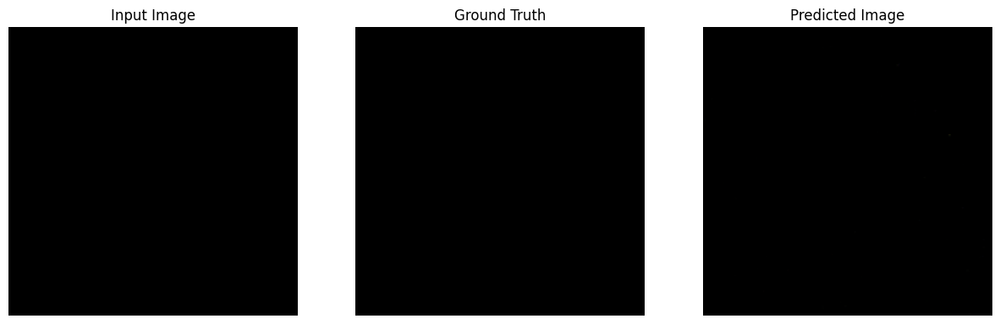

In [291]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(86):
  generate_images(generator, inp, tar)